In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import scanpy.external as sce
from matplotlib import rcParams

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.6.0 anndata==0.7.5 umap==0.4.6 numpy==1.19.4 scipy==1.5.4 pandas==1.1.4 scikit-learn==0.23.2 statsmodels==0.12.1 python-igraph==0.8.3 leidenalg==0.8.3


In [3]:
results_file = '/Users/fernandes/Desktop/sample scseq data/scanpy_test.h5ad'  # the file that will store the analysis results

#### Read in the count matrix into an `AnnData <https://anndata.readthedocs.io/en/latest/anndata.AnnData.html>`__ object, which holds many slots for annotations and different representations of the data. It also comes with its own HDF5 file format: .h5ad.

In [4]:
IEG_list=pd.read_csv('/Users/fernandes/Desktop/sample scseq data/IEG_list.csv', header=None)
IEG_list.columns=['gene']
IEG_list.gene.values

array(['atf3', 'atp1b1b', 'bdnf', 'bhlhe40', 'btg2', 'cebp1', 'cebpb',
       'dusp1', 'dusp5', 'egr1', 'egr2a', 'egr2b', 'egr4', 'fosab',
       'fosb', 'fosl2', 'gadd45ba', 'gadd45bb', 'hsp70l', 'hsp90aa1.2',
       'ier2a', 'ier2b', 'ier5', 'jdp2', 'jdp2b', 'jun', 'junba', 'junbb',
       'jund', 'mcl1a', 'mcl1b', 'myca', 'mycb', 'mycn', 'nfkbiaa',
       'npas4a', 'nr4a1', 'pim1', 'ppp1r15a', 'ptgs2b', 'sik1', 'socs3a',
       'ubc'], dtype=object)

In [5]:
def return_indices_of_a(a, b):
    b_set = set(b)
    return [i for i, v in enumerate(a) if v not in b_set]

def remove_genes(dgc_mat, gene_list):
#Function receives a  gene matrix and a list of genes and returns a  gene matrix without the gene rows.
#The loaded 10x data is a dgc matrix.
  
    idx=return_indices_of_a(dgc_mat.var_names,gene_list.gene.values)
    dgc_mat_corr= dgc_mat[:,idx] 
  
    return (dgc_mat_corr)

In [262]:
adata1 = sc.read_10x_mtx(
    '/Users/fernandes/Desktop/sample scseq data/sample1_7dpf/',  # the directory with the `.mtx` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)                          # write a cache file for faster subsequent reading
adata1.obs['batch']='1'
adata1=remove_genes(adata1, IEG_list)

... reading from cache file cache/Users-fernandes-Desktop-sample scseq data-sample1_7dpf-matrix.h5ad


In [263]:
adata2 = sc.read_10x_mtx(
    '/Users/fernandes/Desktop/sample scseq data/sample2_7dpf/',  # the directory with the `.mtx` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)                          # write a cache file for faster subsequent reading
adata2.obs['batch']='2'
adata2=remove_genes(adata2, IEG_list)

... reading from cache file cache/Users-fernandes-Desktop-sample scseq data-sample2_7dpf-matrix.h5ad


In [264]:
adata3 = sc.read_10x_mtx(
    '/Users/fernandes/Desktop/sample scseq data/sample3_7dpf/',  # the directory with the `.mtx` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)                          # write a cache file for faster subsequent reading
adata3.obs['batch']='3'
adata3=remove_genes(adata3, IEG_list)

... reading from cache file cache/Users-fernandes-Desktop-sample scseq data-sample3_7dpf-matrix.h5ad


In [265]:
adata4 = sc.read_10x_mtx(
    '/Users/fernandes/Desktop/sample scseq data/sample4_7dpf/',  # the directory with the `.mtx` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)                          # write a cache file for faster subsequent reading
adata4.obs['batch']='4'
adata4=remove_genes(adata4, IEG_list)

... reading from cache file cache/Users-fernandes-Desktop-sample scseq data-sample4_7dpf-matrix.h5ad


### Sample 5 was low quality. Not used

In [266]:
adata6 = sc.read_10x_mtx(
    '/Users/fernandes/Desktop/sample scseq data/sample6_6dpf/',  # the directory with the `.mtx` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)                          # write a cache file for faster subsequent reading
adata6.obs['batch']='6'
adata6=remove_genes(adata6, IEG_list)

... reading from cache file cache/Users-fernandes-Desktop-sample scseq data-sample6_6dpf-matrix.h5ad


In [267]:
adata7 = sc.read_10x_mtx(
    '/Users/fernandes/Desktop/sample scseq data/sample7_6dpf/',  # the directory with the `.mtx` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)                          # write a cache file for faster subsequent reading
adata7.obs['batch']='7'
adata7=remove_genes(adata7, IEG_list)

... reading from cache file cache/Users-fernandes-Desktop-sample scseq data-sample7_6dpf-matrix.h5ad


In [268]:
adata8 = sc.read_10x_mtx(
    '/Users/fernandes/Desktop/sample scseq data/sample8_6dpf/',  # the directory with the `.mtx` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)                          # write a cache file for faster subsequent reading
adata8.obs['batch']='8'
adata8=remove_genes(adata8, IEG_list)

... reading from cache file cache/Users-fernandes-Desktop-sample scseq data-sample8_6dpf-matrix.h5ad


In [269]:
adata9 = sc.read_10x_mtx(
    '/Users/fernandes/Desktop/sample scseq data/sample9_7dpf/',  # the directory with the `.mtx` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)                          # write a cache file for faster subsequent reading
adata9.obs['batch']='9'
adata9=remove_genes(adata9, IEG_list)
adata9

... reading from cache file cache/Users-fernandes-Desktop-sample scseq data-sample9_7dpf-matrix.h5ad


View of AnnData object with n_obs × n_vars = 7097 × 32483
    obs: 'batch'
    var: 'gene_ids'

In [270]:
adata4.obs['batch']

AAACCCAAGGCACAAC-1    4
AAACCCACACTCACTC-1    4
AAACCCACAGAAGCGT-1    4
AAACCCAGTTGGTGTT-1    4
AAACCCATCCAAAGGG-1    4
                     ..
TTTGATCTCCTGTTAT-1    4
TTTGGTTCACGGCGTT-1    4
TTTGGTTGTAGTCGTT-1    4
TTTGTTGCACGCGCTA-1    4
TTTGTTGCACTCAGAT-1    4
Name: batch, Length: 2895, dtype: object

In [271]:
adata =adata1.concatenate(adata2,adata3, adata4, adata6, adata7, adata8, adata9)

In [272]:
'''remove not used objects'''
del (adata1,adata2,adata3, adata4, adata6, adata7, adata8, adata9)

# Preprocessing
Show those genes that yield the highest fraction of counts in each single cells, across all cells.

normalizing counts per cell
    finished (0:00:00)


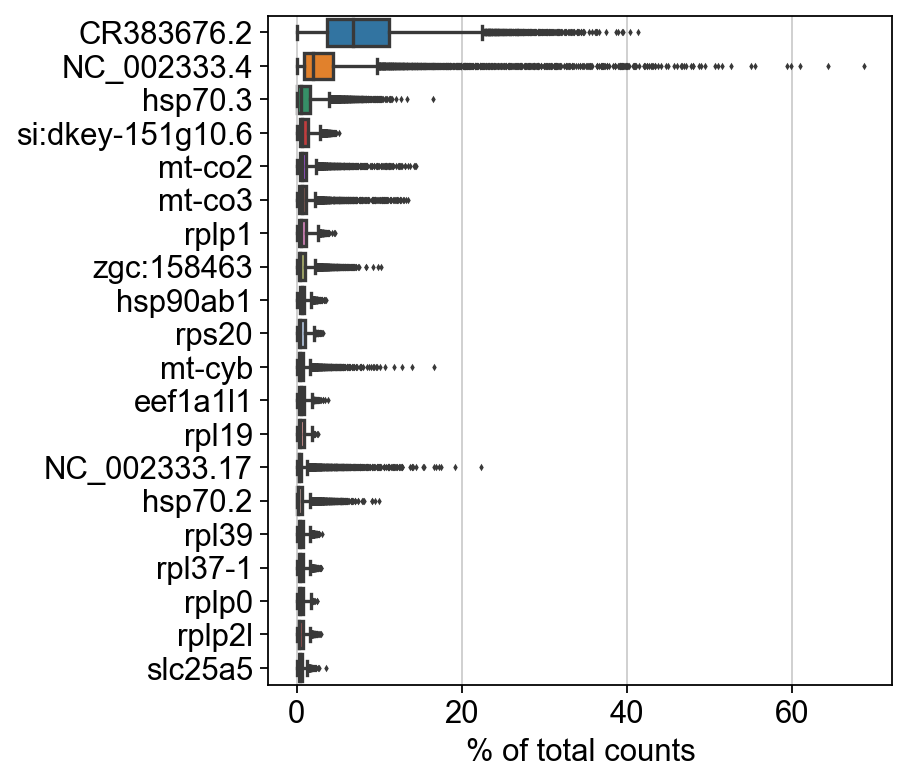

In [273]:
sc.pl.highest_expr_genes(adata, n_top=20, )

#### Basic filtering

In [248]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 15 cells that have less than 200 genes expressed
filtered out 8636 genes that are detected in less than 3 cells


In [249]:
adata.var['mt'] = adata.var_names.str.startswith('mt')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

/Users/fernandes/anaconda3/envs/seq/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/fernandes/anaconda3/envs/seq/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


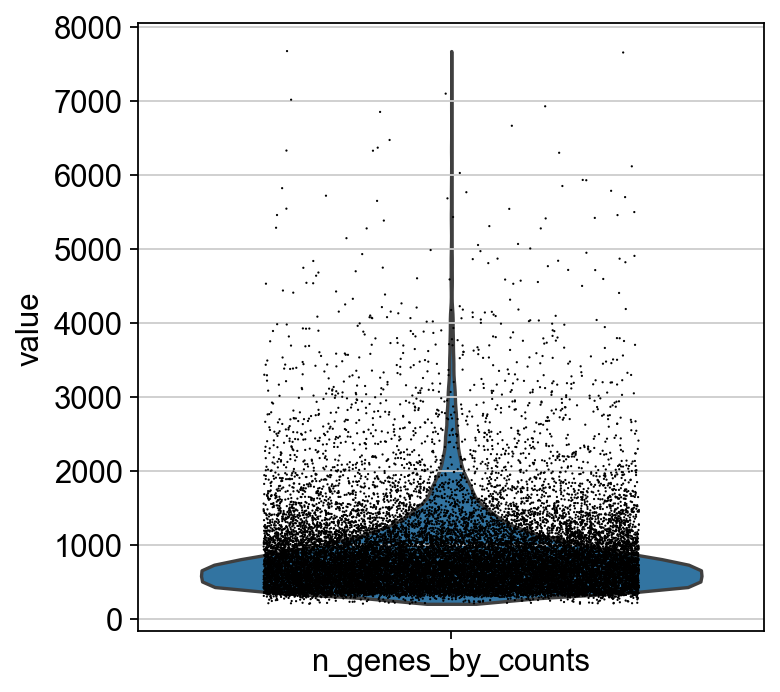

In [250]:
sc.pl.violin(adata, ['n_genes_by_counts'],
             jitter=0.3, multi_panel=False)

/Users/fernandes/anaconda3/envs/seq/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/fernandes/anaconda3/envs/seq/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


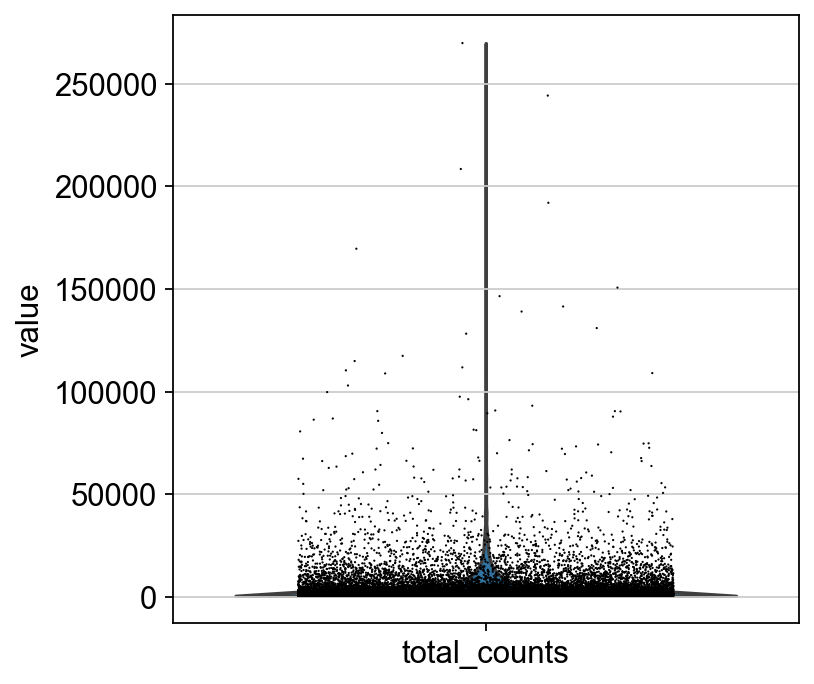

In [251]:
sc.pl.violin(adata, ['total_counts'],
             jitter=0.3, multi_panel=False)

/Users/fernandes/anaconda3/envs/seq/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/fernandes/anaconda3/envs/seq/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


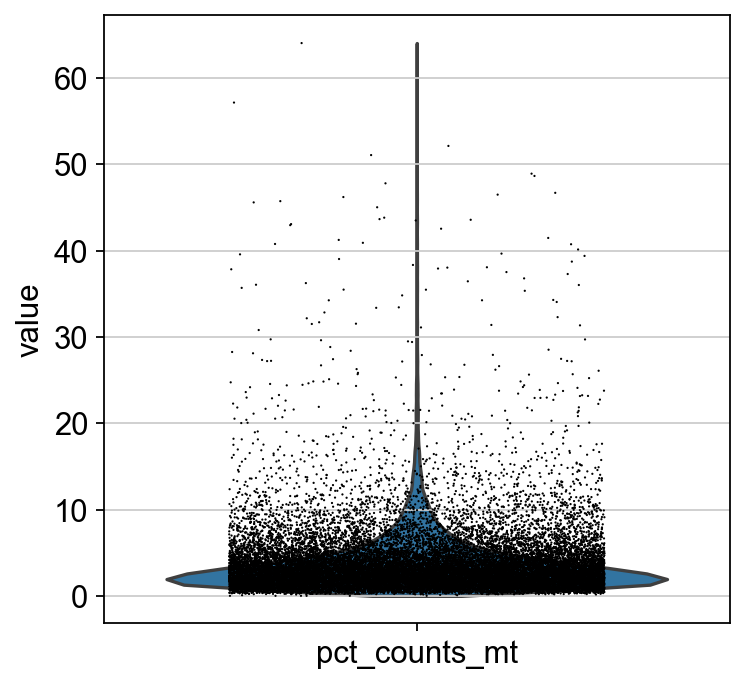

In [252]:
sc.pl.violin(adata, ['pct_counts_mt'],
             jitter=0.3, multi_panel=False)

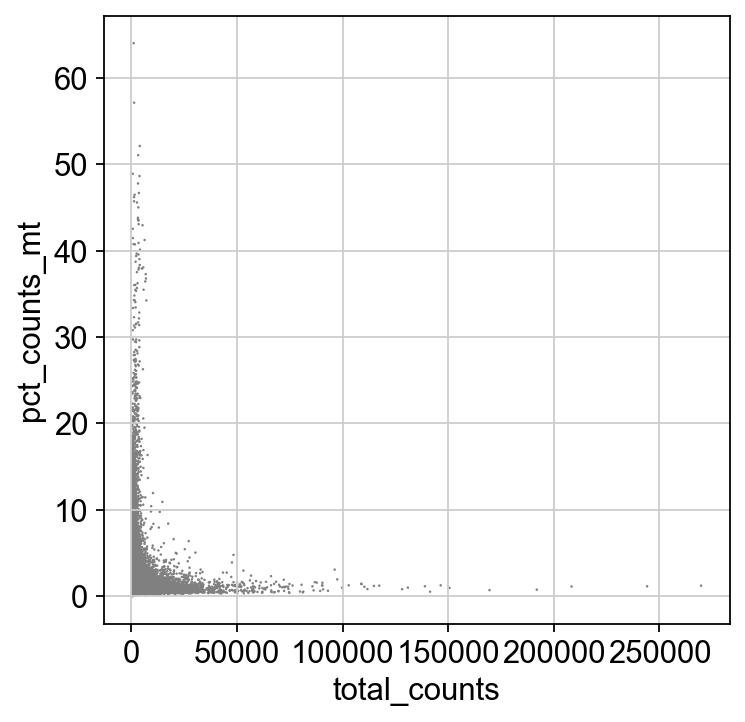

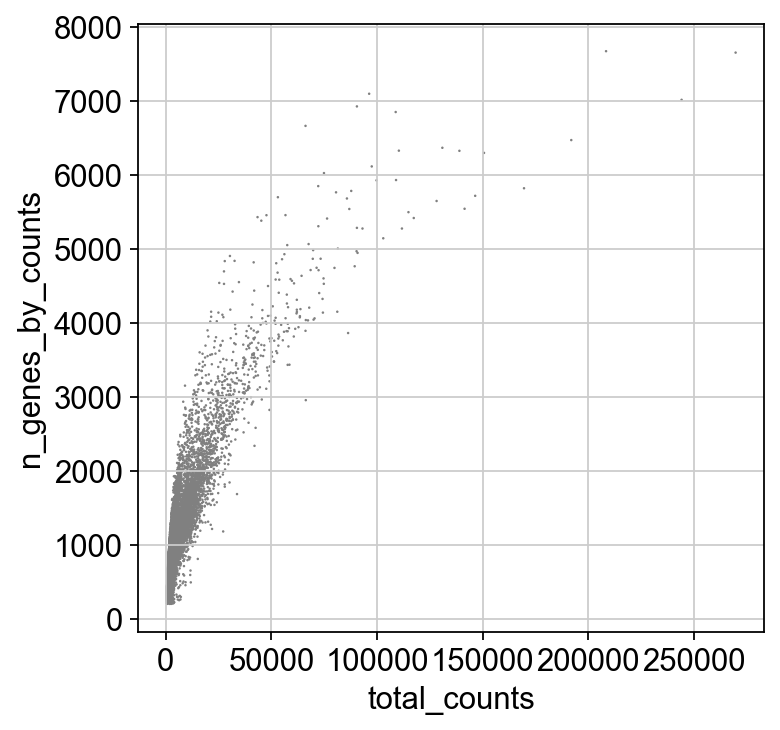

In [253]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [254]:
adata = adata[adata.obs.n_genes_by_counts < 3000, :]
adata = adata[adata.obs.pct_counts_mt < 5, :]

### Total-count normalize (library-size correct) the data matrix 𝐗 to 10,000 reads per cell, so that counts become comparable among cells.

In [255]:
sc.pp.normalize_total(adata, target_sum=10000)

normalizing counts per cell


/Users/fernandes/anaconda3/envs/seq/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)


### Logarithmize the data.

In [256]:
sc.pp.log1p(adata)

In [257]:
sc.pp.scale(adata, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


### Identify highly-variable genes.

In [261]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:07)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


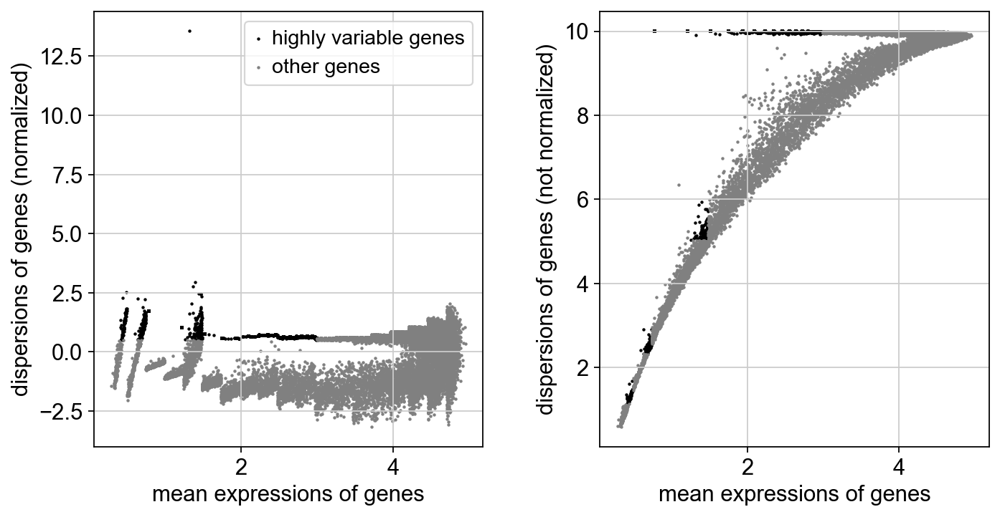

In [259]:
sc.pl.highly_variable_genes(adata)

### Set the .raw attribute of AnnData object to the normalized and logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object.

In [30]:
adata.raw = adata

In [31]:
# filter
adata = adata[:, adata.var.highly_variable]

In [32]:
#Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    finished (0:02:01)


In [33]:
#Scale each gene to unit variance. Clip values exceeding standard deviation 10
sc.pp.scale(adata, max_value=10)

In [34]:
'''#Harmony works by adjusting the principal components, this function should be run after performing PCA but before computing the neighbor graph,'''
sc.tl.pca(adata,svd_solver='arpack') 


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:17)


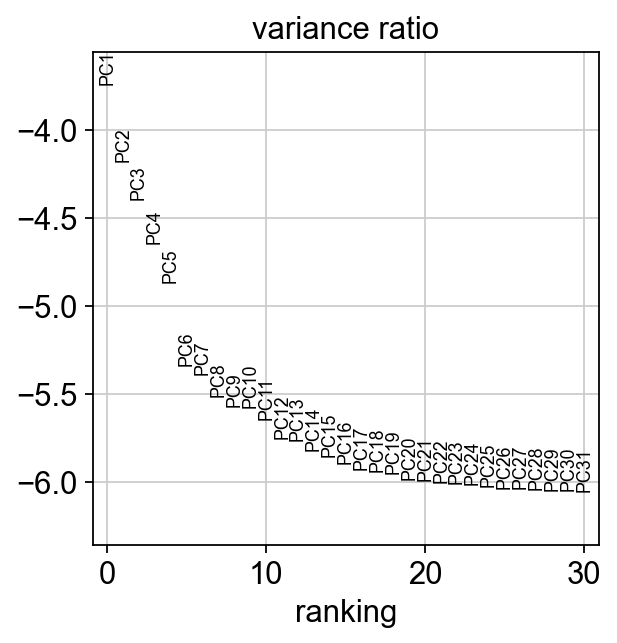

In [35]:
sc.pl.pca_variance_ratio(adata, log=True)

In [36]:
adata_corr=adata.copy()

In [37]:
sce.pp.harmony_integrate(adata_corr, 'batch')#correct batch effect

2020-11-24 23:14:02,326 - harmonypy - INFO - Iteration 1 of 10
2020-11-24 23:14:09,132 - harmonypy - INFO - Iteration 2 of 10
2020-11-24 23:14:15,888 - harmonypy - INFO - Converged after 2 iterations


In [38]:
'X_pca_harmony' in adata_corr.obsm

True

In [39]:
adata.var_names_make_unique()  # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`
adata_corr.var_names_make_unique()

In [40]:
sc.pp.neighbors(adata_corr, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:14)


In [41]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:06)


In [42]:
sc.tl.umap(adata_corr)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


In [43]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


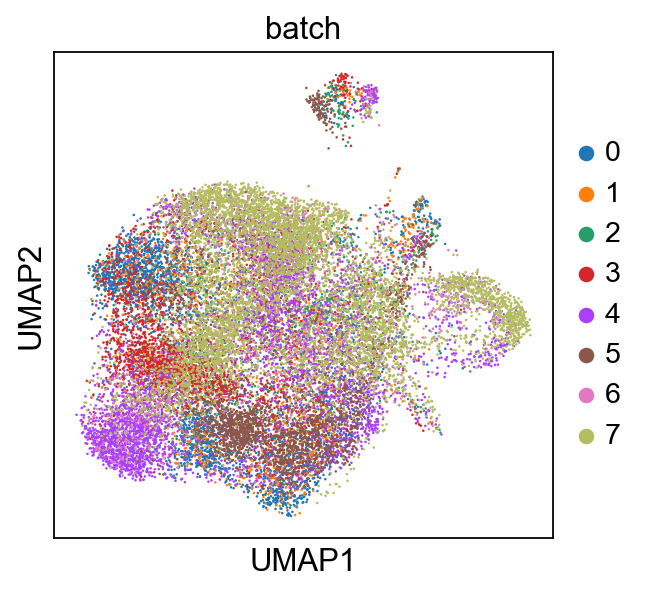

In [44]:
#rcParams['figure.figsize'] = 5, 5
sc.pl.umap(adata, color=['batch'])

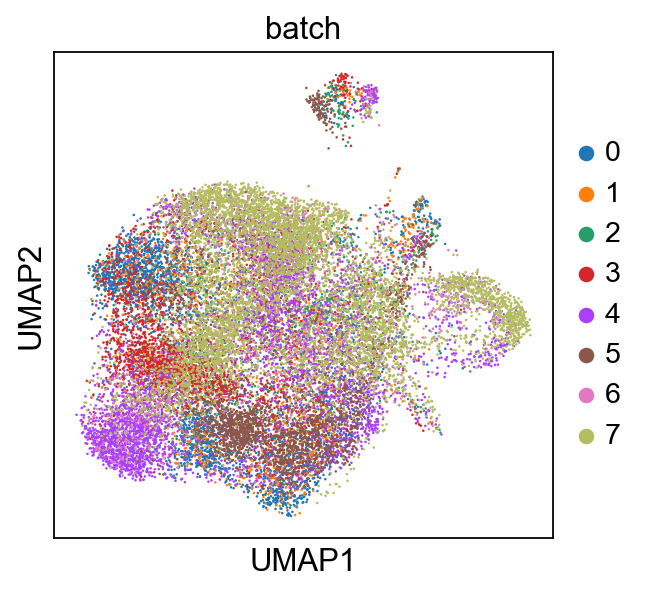

In [45]:
#rcParams['figure.figsize'] = 5, 5
sc.pl.umap(adata_corr, color=['batch'])

In [46]:
adata_corr.write(results_file)

In [47]:
adata_corr

AnnData object with n_obs × n_vars = 22874 × 6086
    obs: 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'batch_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [48]:
adata_corr.var_names

Index(['exorh', 'ptpn12', 'phtf2', 'CU856344.1', 'lrp6', 'RERG',
       'CABZ01085275.1', 'FO834823.1', 'BX890562.1', 'BX890562.3',
       ...
       'GALNT10', 'CABZ01025162.1', 'CABZ01093429.1', 'RAMP3', 'ttc8',
       'CABZ01074745.1', 'CABZ01118270.1', 'CABZ01088864.1', 'CABZ01110379.1',
       'CABZ01109604.1'],
      dtype='object', length=6086)

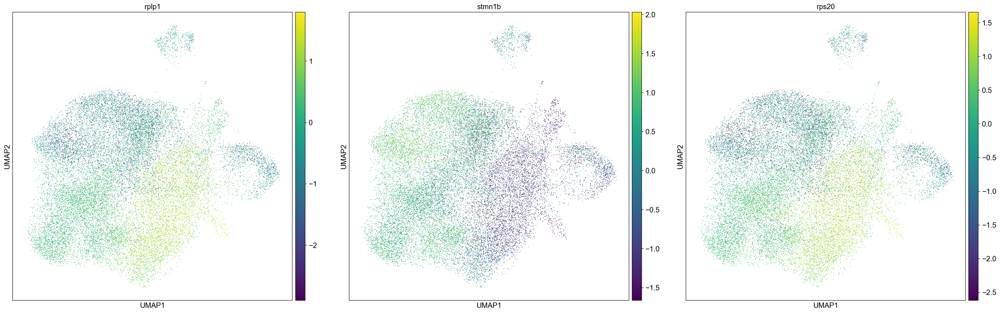

In [55]:
sc.pl.umap(adata_corr, color=['rplp1', 'stmn1b', 'rps20'])

In [50]:
sc.tl.leiden(adata_corr)

running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:03)


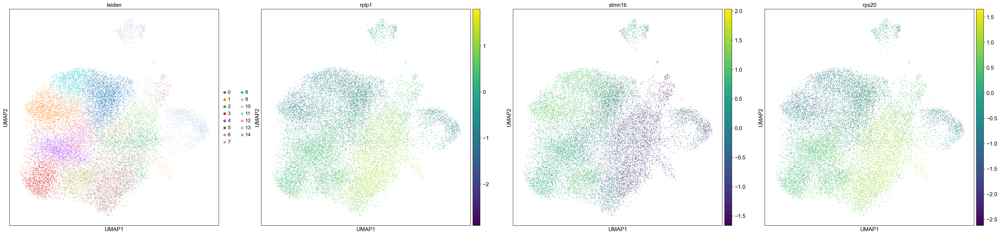

In [58]:
rcParams['figure.figsize'] = 10,10
sc.pl.umap(adata_corr, color=['leiden','rplp1', 'stmn1b', 'rps20'])

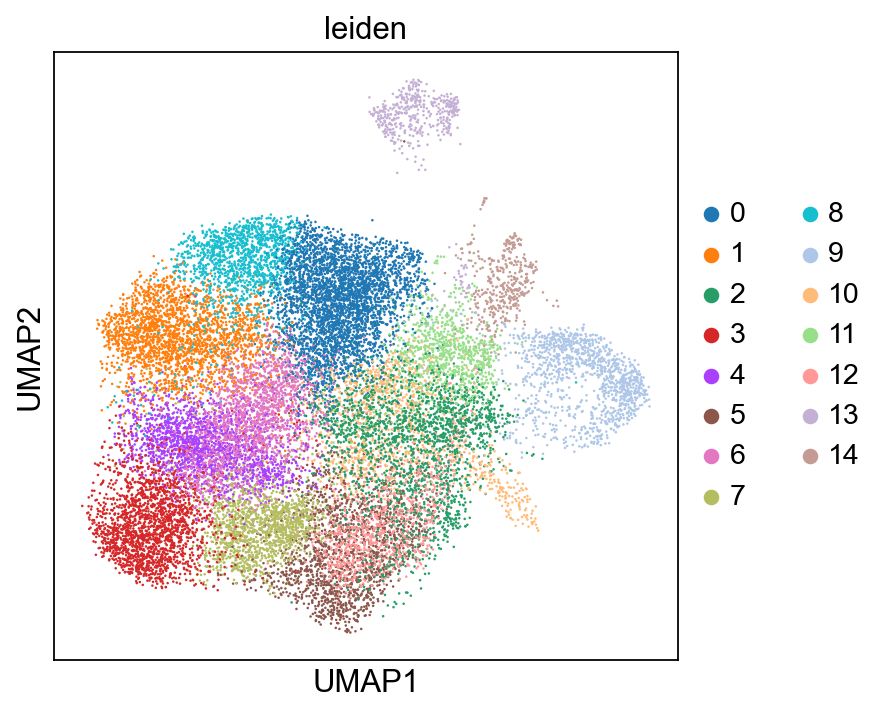

In [59]:
rcParams['figure.figsize'] = 5,5
sc.pl.umap(adata_corr, color='leiden')